In [2]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

import torch
import torchvision
import torchvision.transforms as transforms
import torchvision.transforms.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
import json
import os
from PIL import Image

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Mounted at /content/drive


In [3]:
# Define transform
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor()
])

# Load dataset
dataset = torchvision.datasets.ImageFolder('/content/drive/My Drive/DATASET/Pistachio_Image_Dataset', transform=transform)

# Split dataset into train and test sets
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

print(f"Number of train images: {len(train_dataset)}")
print(f"Number of test images: {len(test_dataset)}")

Number of train images: 1718
Number of test images: 430


In [4]:
import torch.nn as nn
import torch.optim as optim

class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.fc1 = nn.Linear(128 * 16 * 16, 512)
        self.fc2 = nn.Linear(512, 2)  # 2 classes
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = self.pool(self.relu(self.conv3(x)))
        x = x.view(-1, 128 * 16 * 16)
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

model = SimpleCNN().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [5]:
#Train the model
num_epochs = 50

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}')

Epoch [1/50], Loss: 0.4953
Epoch [2/50], Loss: 0.3938
Epoch [3/50], Loss: 0.3613
Epoch [4/50], Loss: 0.3292
Epoch [5/50], Loss: 0.3098
Epoch [6/50], Loss: 0.2749
Epoch [7/50], Loss: 0.2605
Epoch [8/50], Loss: 0.2094
Epoch [9/50], Loss: 0.1911
Epoch [10/50], Loss: 0.1796
Epoch [11/50], Loss: 0.1841
Epoch [12/50], Loss: 0.1189
Epoch [13/50], Loss: 0.1038
Epoch [14/50], Loss: 0.0980
Epoch [15/50], Loss: 0.0817
Epoch [16/50], Loss: 0.0627
Epoch [17/50], Loss: 0.0567
Epoch [18/50], Loss: 0.0489
Epoch [19/50], Loss: 0.0413
Epoch [20/50], Loss: 0.0317
Epoch [21/50], Loss: 0.0681
Epoch [22/50], Loss: 0.0292
Epoch [23/50], Loss: 0.0138
Epoch [24/50], Loss: 0.0351
Epoch [25/50], Loss: 0.0322
Epoch [26/50], Loss: 0.0272
Epoch [27/50], Loss: 0.0106
Epoch [28/50], Loss: 0.0097
Epoch [29/50], Loss: 0.0308
Epoch [30/50], Loss: 0.0310
Epoch [31/50], Loss: 0.0324
Epoch [32/50], Loss: 0.0076
Epoch [33/50], Loss: 0.0066
Epoch [34/50], Loss: 0.0031
Epoch [35/50], Loss: 0.0015
Epoch [36/50], Loss: 0.0006
E

In [6]:
from sklearn.metrics import precision_score, recall_score, f1_score

model.eval()
correct = 0
total = 0
predictions = []
true_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)

        predictions.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())

        total += labels.size(0)
        correct += (predicted == labels).sum().item()

accuracy = 100 * correct / total
print(f'Accuracy: {accuracy:.2f}%')

precision = precision_score(true_labels, predictions, average='macro')
recall = recall_score(true_labels, predictions, average='macro')
f1 = f1_score(true_labels, predictions, average='macro')

print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')

Accuracy: 94.19%
Precision: 0.9447
Recall: 0.9377
F1 Score: 0.9405


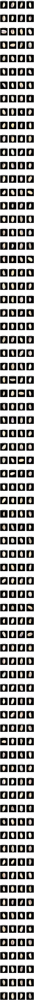

In [7]:
import matplotlib.pyplot as plt

def show_predictions(model, loader, class_names, num_images=8):
    model.eval()
    images_so_far = 0
    fig = plt.figure(figsize=(15, num_images // 4 * 6))

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)

            for i in range(images.size(0)):
                images_so_far += 1
                ax = plt.subplot(num_images // 4, 4, images_so_far)
                ax.imshow(images[i].cpu().permute(1, 2, 0))
                ax.set_title(f'Pred: {class_names[predicted[i]]}\nActual: {class_names[labels[i]]}', fontsize=10)
                ax.axis('off')

                if images_so_far == num_images:
                    plt.show()
                    return

# Define class names
class_names = dataset.classes

# Show predictions on test dataset
show_predictions(model, test_loader, class_names, num_images=300)

In [8]:
# Save the trained model
torch.save(model.state_dict(), 'simple_cnn_model.pth')

print("Model saved successfully.")

Model saved successfully.
